# Module 5: BOW, Vector Spaces, and TFIDF

* DS 5001
* Raf Alvarado

# Overview

In this notebook, we explore Luhn's concept of term significance in light of Zipf's Law, TFIDF, and vector space models of text. 

Recall Luhn's (1958) representation of the problem:

<img src="https://keep.google.com/u/0/media/v2/1sejm7ApXHSqRKIyNj3gwdAmzSP1hWW_Zo_vMNeisIeNyoxJJije0g2fCAGej/1AaLvSK1xIoctnS3XUh0SEd0Cx2RPlTFLqn0hHrFynWgoKi802glZOKMo5S74zg?accept=image/gif,image/jpeg,image/jpg,image/png,image/webp,audio/aac&sz=695">

In this notebook, we look at ways to approximate the significance curve using the ideas we learned in this module.

# Set Up

## Config

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount= True)

my_path = "/DS_5001/"
data_dir = "/content/drive" + "/My Drive" + my_path

Mounted at /content/drive


In [ ]:
count_method = 'n' # 'c' or 'n' # n = n tokens, c = distinct token (term) count
tf_method = 'sum' # sum, max, log, double_norm, raw, binary
tf_norm_k = .5 # only used for double_norm
idf_method = 'standard' # standard, max, smooth
gradient_cmap = 'GnBu' # YlGn, GnBu, YlGnBu; For tables; see https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html 

In [ ]:
OHCO = ['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num']
SENTS = OHCO[:4]
PARAS = OHCO[:3]
CHAPS = OHCO[:2]
BOOKS = OHCO[:1]

In [ ]:
bag = CHAPS

## Import

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
#!pip install plotly_express
import plotly_express as px

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pd.__version__

'1.3.5'

In [ ]:
sns.set()
%matplotlib inline

# Prepare the data

## Import tables

In [ ]:
%%time
LIB = pd.read_csv(data_dir + "LIB.csv").set_index(BOOKS)
TOKEN = pd.read_csv(data_dir + 'TOKEN.csv').set_index(OHCO)
VOCAB = pd.read_csv(data_dir + 'VOCAB.csv').set_index('term_id')
# DOC = pd.read_csv(data_dir + "DOC.csv").set_index(PARAS)

CPU times: user 2.4 s, sys: 536 ms, total: 2.94 s
Wall time: 4.3 s


In [ ]:
LIB.head()

,book_title,book_file
book_id,,
158,"Emma, by Jane Austen",/content/drive/My Drive/DS_5001/epubs/AUSTEN_J...
946,"Lady Susan, by Jane Austen",/content/drive/My Drive/DS_5001/epubs/AUSTEN_J...
1212,"Love And Freindship And Other Early Works, by ...",/content/drive/My Drive/DS_5001/epubs/AUSTEN_J...
141,"Mansfield Park, by Jane Austen",/content/drive/My Drive/DS_5001/epubs/AUSTEN_J...
121,"Northanger Abbey, by Jane Austen",/content/drive/My Drive/DS_5001/epubs/AUSTEN_J...


In [ ]:
VOCAB.head()

,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster
term_id,,,,,,,
0,NaN,412938,0,0,NaN,NaN,NaN
1,0,2,1,0,0,0,0
2,1,18,1,0,1,1,1
3,10,6,1,0,10,10,10
4,100,2,1,0,100,100,100


In [ ]:
TOKEN.head()

pos_tuple  pos  \
book_id chap_num para_num sent_num token_num                              
158     1        1        0        0               ('Emma', 'NNP')  NNP   
                                   1          ('Woodhouse', 'NNP')  NNP   
                                   2                    (',', ',')    ,   
                                   3            ('handsome', 'NN')   NN   
                                   4                    (',', ',')    ,   

                                              token_str   term_str  
book_id chap_num para_num sent_num token_num                        
158     1        1        0        0               Emma       emma  
                                   1          Woodhouse  woodhouse  
                                   2                  ,        NaN  
                                   3           handsome   handsome  
                                   4                  ,        NaN

In [ ]:
# DOC.head()

## Add term_id to TOKEN table

We need to do this to combine the VOCAB and TOKEN tables more efficiently.

In [ ]:
# Need to find out why there are NAs ...
VOCAB = VOCAB.dropna()
TOKEN = TOKEN.dropna()

In [ ]:
TOKEN['term_id'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)

In [ ]:
TOKEN.head()

pos_tuple  pos  \
book_id chap_num para_num sent_num token_num                              
158     1        1        0        0               ('Emma', 'NNP')  NNP   
                                   1          ('Woodhouse', 'NNP')  NNP   
                                   3            ('handsome', 'NN')   NN   
                                   5              ('clever', 'NN')   NN   
                                   7                 ('and', 'CC')   CC   

                                              token_str   term_str  term_id  
book_id chap_num para_num sent_num token_num                                 
158     1        1        0        0               Emma       emma  11614.0  
                                   1          Woodhouse  woodhouse  39338.0  
                                   3           handsome   handsome  15924.0  
                                   5             clever     clever   6354.0  
                                   7                and        and   1426.0

## Add Max POS to VOCAB

In [ ]:
VOCAB['pos_max'] = TOKEN.groupby(['term_id', 'pos']).count().iloc[:,0].unstack().idxmax(1)

In [ ]:
VOCAB.head()

,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max
term_id,,,,,,,,
1,0,2,1,0,0,0,0,CD
2,1,18,1,0,1,1,1,CD
3,10,6,1,0,10,10,10,CD
4,100,2,1,0,100,100,100,CD
5,1000,2,1,0,1000,1000,1000,CD


## Compare POS Stats in TOKEN and VOCAB

In [ ]:
POS = TOKEN.pos.value_counts().to_frame().rename(columns={'pos':'n'})
POS.index.name = 'pos_id'

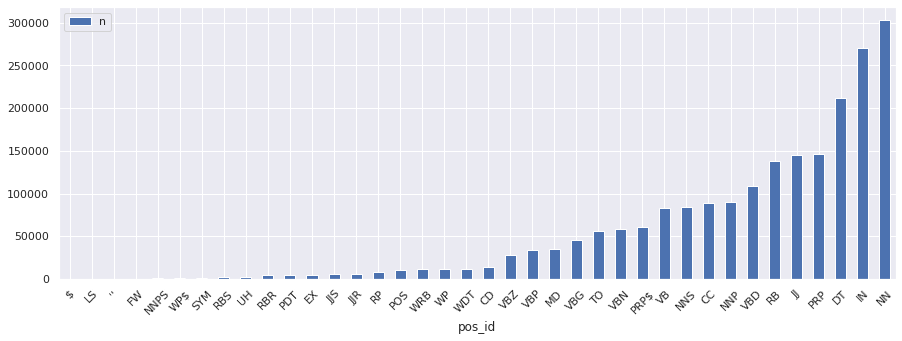

In [ ]:
POS.sort_values('n').plot.bar(y='n', figsize=(15,5), rot=45);

In [ ]:
POS_MAX = VOCAB.pos_max.value_counts().to_frame().rename(columns={'pos_max':'n'})
POS_MAX.index.name = 'pos_id'

In [ ]:
# POS_MAX.sort_values('n').plot.bar(y='n', figsize=(15,5), rot=45);

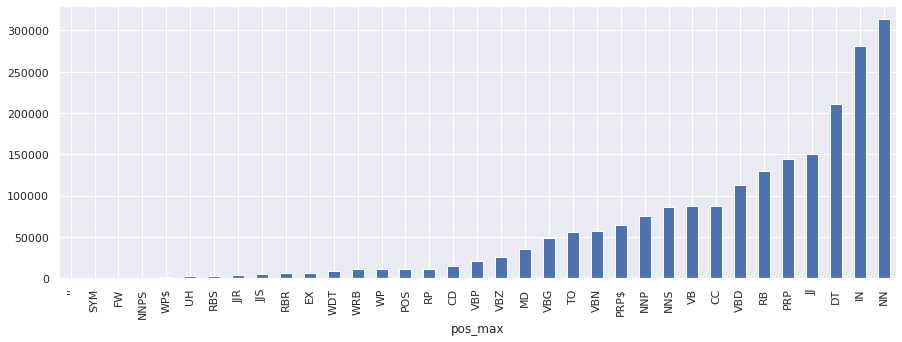

In [ ]:
VOCAB.groupby('pos_max').n.sum().sort_values().plot.bar(figsize=(15,5));

In [ ]:
# VOCAB[VOCAB.pos_max == 'NN'].sort_values('term_rank').head(10)

In [ ]:
POS['max_n'] = POS_MAX['n']

In [ ]:
POS.head()

,n,max_n
pos_id,,
NN,303157,11373.0
IN,270031,122.0
DT,212225,22.0
PRP,145774,26.0
JJ,145663,5156.0


In [ ]:
fig = px.scatter(POS.reset_index(), x='n', y='max_n', text='pos_id')
fig.data[0].update(mode='text')
fig.show()

# Zipf's Law

$f \propto \frac{1}{r} $

$k =  fr$

## Add Term Rank to VOCAB

In [ ]:
if 'term_rank' not in VOCAB.columns:
    VOCAB = VOCAB.sort_values('n', ascending=False).reset_index()
    VOCAB.index.name = 'term_rank'
    VOCAB = VOCAB.reset_index()
    VOCAB = VOCAB.set_index('term_id')
    VOCAB['term_rank'] = VOCAB['term_rank'] + 1

In [ ]:
VOCAB.head()

,term_rank,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max
term_id,,,,,,,,,
34776,1,the,110093,0,1,the,the,the,DT
23891,2,of,65993,0,1,of,of,of,IN
1426,3,and,63528,0,1,and,and,and,CC
35245,4,to,56221,0,1,to,to,to,TO
199,5,a,44577,0,1,a,a,a,DT


## Alternate Rank

In [ ]:
new_rank = VOCAB.n.value_counts()\
    .sort_index(ascending=False).reset_index().reset_index()\
    .rename(columns={'level_0':'term_rank2', 'index':'n', 'n':'nn'})\
    .set_index('n')
VOCAB['term_rank2'] = VOCAB.n.map(new_rank.term_rank2) + 1

In [ ]:
VOCAB.head()

,term_rank,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max,term_rank2
term_id,,,,,,,,,,
34776,1,the,110093,0,1,the,the,the,DT,1
23891,2,of,65993,0,1,of,of,of,IN,2
1426,3,and,63528,0,1,and,and,and,CC,3
35245,4,to,56221,0,1,to,to,to,TO,4
199,5,a,44577,0,1,a,a,a,DT,5


In [ ]:
VOCAB['p'] = VOCAB.n / TOKEN.shape[0]

## Compute Zipf's K

In [ ]:
VOCAB['zipf_k'] = VOCAB.n * VOCAB.term_rank

In [ ]:
VOCAB['zipf_k2'] = VOCAB.n * VOCAB.term_rank2

In [ ]:
VOCAB['zipf_k3'] = VOCAB.p * VOCAB.term_rank2

In [ ]:
VOCAB.describe().T

,count,mean,std,min,25%,50%,75%,max
term_rank,39743.0,19872.000000,11472.960211,1.000000e+00,9.936500e+03,19872.000000,29807.500000,39743.000000
n,39743.0,52.458823,954.321299,1.000000e+00,1.000000e+00,3.000000,12.000000,110093.000000
num,39743.0,0.004982,0.070408,0.000000e+00,0.000000e+00,0.000000,0.000000,1.000000
stop,39743.0,0.003472,0.058825,0.000000e+00,0.000000e+00,0.000000,0.000000,1.000000
term_rank2,39743.0,773.355585,73.546509,1.000000e+00,7.840000e+02,793.000000,795.000000,795.000000
p,39743.0,0.000025,0.000458,4.796439e-07,4.796439e-07,0.000001,0.000006,0.052805
zipf_k,39743.0,83385.257655,51923.205104,2.763100e+04,3.756650e+04,66327.000000,117577.500000,315216.000000
zipf_k2,39743.0,13402.885162,32317.873599,7.950000e+02,7.950000e+02,2379.000000,9408.000000,315216.000000
zipf_k3,39743.0,0.006429,0.015501,3.813169e-04,3.813169e-04,0.001141,0.004512,0.151191


In [ ]:
VOCAB[VOCAB.zipf_k <= VOCAB.zipf_k.quantile(.1)].sort_values('zipf_k', ascending=True).head()

,term_rank,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3
term_id,,,,,,,,,,,,,,
8323,27631,crosslights,1,0,0,crosslight,crosslight,crosslight,NNS,795,4.796439e-07,27631,795,0.000381
8758,27632,darkesome,1,0,0,darkesom,darkesom,darkesom,VBP,795,4.796439e-07,27632,795,0.000381
35294,27633,tola,1,0,0,tola,tola,tol,NNP,795,4.796439e-07,27633,795,0.000381
33235,27634,stowell,1,0,0,stowel,stowel,stowel,NNP,795,4.796439e-07,27634,795,0.000381
8390,27635,crumpling,1,0,0,crumpl,crumpl,crumpl,NN,795,4.796439e-07,27635,795,0.000381


In [ ]:
VOCAB[VOCAB.zipf_k >= VOCAB.zipf_k.quantile(.9)].sort_values('zipf_k', ascending=False).head()

,term_rank,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3
term_id,,,,,,,,,,,,,,
14364,33,from,9552,0,1,from,from,from,IN,33,0.004582,315216,315216,0.151191
2284,23,at,13627,0,1,at,at,at,IN,23,0.006536,313421,313421,0.150330
16154,30,have,10436,0,1,have,have,hav,VB,30,0.005006,313080,313080,0.150167
16610,34,him,9194,0,1,him,him,him,PRP,34,0.004410,312596,312596,0.149935
34906,32,this,9717,0,1,thi,this,thi,DT,32,0.004661,310944,310944,0.149142


## Visualize

### Histogram of Zipf K

In [ ]:
px.histogram(VOCAB, 'zipf_k', marginal='box')

In [ ]:
px.histogram(VOCAB, 'zipf_k2', marginal='box')

###  Rank and N

In [ ]:
px.scatter(VOCAB[VOCAB.term_rank <= 10000], x='term_rank', y='n', log_y=False, log_x=False, hover_name='term_str', color='pos_max')

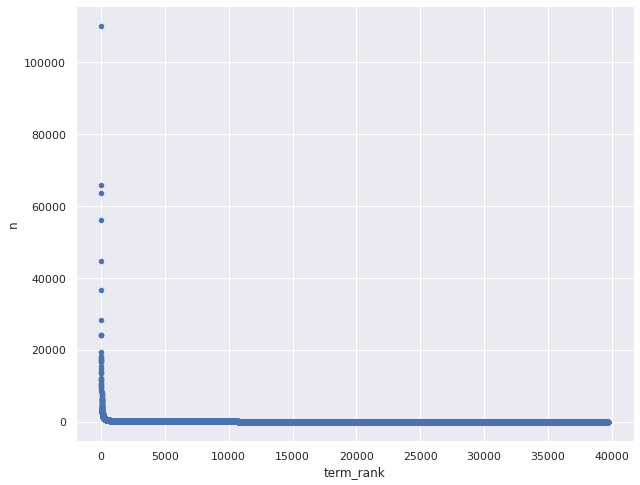

In [ ]:
VOCAB.plot.scatter('term_rank', 'n', figsize=(10,8))

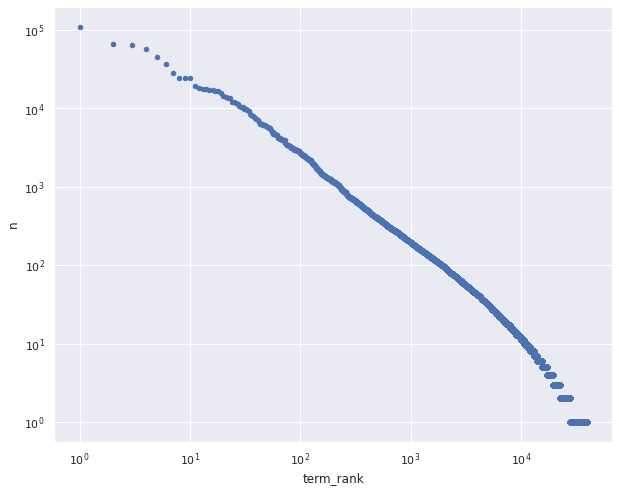

In [ ]:
VOCAB.plot.scatter('term_rank', 'n', figsize=(10,8), logx=True, logy=True);

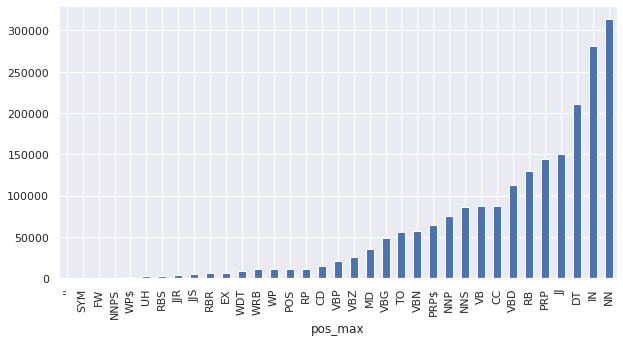

In [ ]:
VOCAB.groupby('pos_max').n.sum().sort_values().plot.bar(figsize=(10,5));

In [ ]:
px.scatter(VOCAB[VOCAB.term_rank <= 10000], x='term_rank', y='n', log_y=True, log_x=True, hover_name='term_str', color='pos_max')

### Rank and Zipf K

In [ ]:
px.scatter(VOCAB, x='term_rank', y='zipf_k', hover_name='term_str', hover_data=['n'], log_y=True, log_x=True, color='pos_max')

## Demo Rank Index

In [ ]:
rank_index = [1, 2, 3, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000]

In [ ]:
demo = VOCAB.loc[VOCAB.term_rank.isin(rank_index), ['term_str', 'term_rank', 'n', 'zipf_k', 'pos_max']]

In [ ]:
demo.style.background_gradient(cmap=gradient_cmap, high=.5)

,term_str,term_rank,n,zipf_k,pos_max
term_id,,,,,
34776,the,1,110093,110093,DT
23891,of,2,65993,131986,IN
1426,and,3,63528,190584,CC
18993,it,10,23976,239760,PRP
39663,you,20,14542,290840,PRP
16154,have,30,10436,313080,VB
24018,one,40,7386,295440,CD
1893,are,50,5787,289350,VBP
39041,who,60,4612,276720,WP


# VOCAB Entropy

## Compute P of VOCAB

This is the prior, or marginal, probability of a term.

In [ ]:
%%time
VOCAB['p'] = VOCAB.n / VOCAB.n.sum()

CPU times: user 2.13 ms, sys: 9 µs, total: 2.14 ms
Wall time: 2.15 ms


## Compute Entropy of VOCAB

In [ ]:
VOCAB['h'] = VOCAB.p * np.log2(1/VOCAB.p) # Self entropy of each word 
H = VOCAB.h.sum()
N_v = VOCAB.shape[0]
H_max = np.log2(N_v)
R = round(1 - (H/H_max), 2) * 100

In [ ]:
print("H \t= {}\nH_max \t= {}\nR \t= {}%".format(H, H_max, int(R)))

H 	= 10.003444767610423
H_max 	= 15.27841315806974
R 	= 35%


# BOW

In [ ]:
BOW = TOKEN.groupby(bag+['term_id']).term_id.count()\
    .to_frame().rename(columns={'term_id':'n'})

In [ ]:
BOW['c'] = BOW.n.astype('bool').astype('int')

In [ ]:
BOW.head()

n  c
book_id chap_num term_id      
105     1        2.0      2  1
                 28.0     1  1
                 37.0     1  1
                 56.0     1  1
                 67.0     1  1

# Document-Term Matrix

We create a document-term count matrix. Note that we can create a matrix for any of the features in BOW. Also, see how the OHCO helps us distinguish between features and observation identity.

Note, these operations are slower than using `groupby()`.

## Create Count Matrix

In [ ]:
%%time
DTCM = BOW[count_method].unstack().fillna(0).astype('int')

CPU times: user 705 ms, sys: 198 ms, total: 903 ms
Wall time: 904 ms


In [ ]:
DTCM.head(10)

term_id           1.0      2.0      3.0      4.0      5.0      6.0      \
book_id chap_num                                                         
105     1               0        2        0        0        0        0   
        2               0        0        0        0        0        0   
        3               0        0        0        0        0        0   
        4               0        0        0        0        0        0   
        5               0        0        0        0        0        0   
        6               0        0        0        0        0        0   
        7               0        0        0        0        0        0   
        8               0        0        0        0        0        0   
        9               0        0        0        0        0        0   
        10              0        0        0        0        0        0   

term_id           7.0      8.0      9.0      10.0     ...  39739.0  39740.0  \
book_id chap_num                                      ...                     
105     1               0        0        0        0  ...        0        0   
        2               0        0        0        0  ...        0        0   
        3               0        0        0        0  ...        0        0   
        4               0        0        0        0  ...        0        0   
        5               0        0        0        0  ...        0        0   
        6               0        0        0        0  ...        0        0   
        7               0        0        0        0  ...        0        0   
        8               0        0        0        0  ...        0        0   
        9               0        0        0        0  ...        0        0   
        10              0        0        0        0  ...        0        0   

term_id           39741.0  39742.0  39743.0  39744.0  39745.0  39746.0  \
book_id chap_num                                                         
105     1               0        0        0        0        0        0   
        2               0        0        0        0        0        0   
        3               0        0        0        0        0        0   
        4               0        0        0        0        0        0   
        5               0        0        0        0        0        0   
        6               0        0        0        0        0        0   
        7               0        0        0        0        0        0   
        8               0        0        0        0        0        0   
        9               0        0        0        0        0        0   
        10              0        0        0        0        0        0   

term_id           39747.0  39748.0  
book_id chap_num                    
105     1               0        0  
        2               0        0  
        3               0        0  
        4               0        0  
        5               0        0  
        6               0        0  
        7               0        0  
        8               0        0  
        9               0        0  
        10              0        0  

[10 rows x 39743 columns]

## Compute TF

In [ ]:
%%time
print('TF method:', tf_method)
if tf_method == 'sum':
    TF = DTCM.T / DTCM.T.sum()
elif tf_method == 'max':
    TF = DTCM.T / DTCM.T.max()
elif tf_method == 'log':
    TF = np.log10(1 + DTCM.T)
elif tf_method == 'raw':
    TF = DTCM.T
elif tf_method == 'double_norm':
    TF = DTCM.T / DTCM.T.max()
    TF = tf_norm_k + (1 - tf_norm_k) * TF[TF > 0]
elif tf_method == 'binary':
    TF = DTCM.T.astype('bool').astype('int')
TF = TF.T

TF method: sum
CPU times: user 315 ms, sys: 1.07 ms, total: 316 ms
Wall time: 191 ms


In [ ]:
TF.head()

term_id           1.0       2.0      3.0      4.0      5.0      6.0      \
book_id chap_num                                                          
105     1             0.0  0.000758      0.0      0.0      0.0      0.0   
        2             0.0  0.000000      0.0      0.0      0.0      0.0   
        3             0.0  0.000000      0.0      0.0      0.0      0.0   
        4             0.0  0.000000      0.0      0.0      0.0      0.0   
        5             0.0  0.000000      0.0      0.0      0.0      0.0   

term_id           7.0      8.0      9.0      10.0     ...  39739.0  39740.0  \
book_id chap_num                                      ...                     
105     1             0.0      0.0      0.0      0.0  ...      0.0      0.0   
        2             0.0      0.0      0.0      0.0  ...      0.0      0.0   
        3             0.0      0.0      0.0      0.0  ...      0.0      0.0   
        4             0.0      0.0      0.0      0.0  ...      0.0      0.0   
        5             0.0      0.0      0.0      0.0  ...      0.0      0.0   

term_id           39741.0  39742.0  39743.0  39744.0  39745.0  39746.0  \
book_id chap_num                                                         
105     1             0.0      0.0      0.0      0.0      0.0      0.0   
        2             0.0      0.0      0.0      0.0      0.0      0.0   
        3             0.0      0.0      0.0      0.0      0.0      0.0   
        4             0.0      0.0      0.0      0.0      0.0      0.0   
        5             0.0      0.0      0.0      0.0      0.0      0.0   

term_id           39747.0  39748.0  
book_id chap_num                    
105     1             0.0      0.0  
        2             0.0      0.0  
        3             0.0      0.0  
        4             0.0      0.0  
        5             0.0      0.0  

[5 rows x 39743 columns]

## Compute DF

In [ ]:
%%time
DF = DTCM[DTCM > 0].count()

CPU times: user 12.8 s, sys: 1.16 s, total: 14 s
Wall time: 12.9 s


In [ ]:
DF.head()

term_id
1.0     1
2.0    11
3.0     5
4.0     2
5.0     2
dtype: int64

## Compute IDF

In [ ]:
N = DTCM.shape[0]

In [ ]:
%%time
print('IDF method:', idf_method)
if idf_method == 'standard':
    IDF = np.log10(N / DF)
elif idf_method == 'max':
    IDF = np.log10(DF.max() / DF) 
elif idf_method == 'smooth':
    IDF = np.log10((1 + N) / (1 + DF)) + 1

IDF method: standard
CPU times: user 4.48 ms, sys: 2 ms, total: 6.48 ms
Wall time: 4.21 ms


## Compute TFIDF

In [ ]:
TFIDF = TF * IDF

In [ ]:
TFIDF.head()

term_id           1.0       2.0      3.0      4.0      5.0      6.0      \
book_id chap_num                                                          
105     1             0.0  0.001522      0.0      0.0      0.0      0.0   
        2             0.0  0.000000      0.0      0.0      0.0      0.0   
        3             0.0  0.000000      0.0      0.0      0.0      0.0   
        4             0.0  0.000000      0.0      0.0      0.0      0.0   
        5             0.0  0.000000      0.0      0.0      0.0      0.0   

term_id           7.0      8.0      9.0      10.0     ...  39739.0  39740.0  \
book_id chap_num                                      ...                     
105     1             0.0      0.0      0.0      0.0  ...      0.0      0.0   
        2             0.0      0.0      0.0      0.0  ...      0.0      0.0   
        3             0.0      0.0      0.0      0.0  ...      0.0      0.0   
        4             0.0      0.0      0.0      0.0  ...      0.0      0.0   
        5             0.0      0.0      0.0      0.0  ...      0.0      0.0   

term_id           39741.0  39742.0  39743.0  39744.0  39745.0  39746.0  \
book_id chap_num                                                         
105     1             0.0      0.0      0.0      0.0      0.0      0.0   
        2             0.0      0.0      0.0      0.0      0.0      0.0   
        3             0.0      0.0      0.0      0.0      0.0      0.0   
        4             0.0      0.0      0.0      0.0      0.0      0.0   
        5             0.0      0.0      0.0      0.0      0.0      0.0   

term_id           39747.0  39748.0  
book_id chap_num                    
105     1             0.0      0.0  
        2             0.0      0.0  
        3             0.0      0.0  
        4             0.0      0.0  
        5             0.0      0.0  

[5 rows x 39743 columns]

## Move things to their places

In [ ]:
VOCAB['df'] = DF
VOCAB['idf'] = IDF

In [ ]:
VOCAB.head()

,term_rank,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,h,df,idf
term_id,,,,,,,,,,,,,,,,,
34776,1,the,110093,0,1,the,the,the,DT,1,0.052806,110093,110093,0.052805,0.224063,1122,0.000000
23891,2,of,65993,0,1,of,of,of,IN,2,0.031653,131986,131986,0.063306,0.157681,1122,0.000000
1426,3,and,63528,0,1,and,and,and,CC,3,0.030471,190584,190584,0.091412,0.153465,1120,0.000775
35245,4,to,56221,0,1,to,to,to,TO,4,0.026966,224884,224884,0.107864,0.140567,1121,0.000387
199,5,a,44577,0,1,a,a,a,DT,5,0.021381,222885,222885,0.106905,0.118612,1120,0.000775


In [ ]:
BOW['tf'] = TF.stack()
BOW['tfidf'] = TFIDF.stack()

In [ ]:
BOW.head()

n  c        tf     tfidf
book_id chap_num term_id                          
105     1        2.0      2  1  0.000758  0.001522
                 28.0     1  1  0.000379  0.001041
                 37.0     1  1  0.000379  0.001155
                 56.0     1  1  0.000379  0.001155
                 67.0     1  1  0.000379  0.001155

## Apply aggregates to VOCAB

In [ ]:
%%time
VOCAB['tfidf_mean'] = TFIDF[TFIDF > 0].mean().fillna(0) # EXPLAIN
VOCAB['tfidf_sum'] = TFIDF.sum()
VOCAB['tfidf_median'] = TFIDF[TFIDF > 0].median().fillna(0) # EXPLAIN
VOCAB['tfidf_max'] = TFIDF.max()

CPU times: user 5.29 s, sys: 29.8 ms, total: 5.32 s
Wall time: 7.73 s


## Observe results

In [ ]:
VOCAB.sort_values('tfidf_sum', ascending=False).head(50).style.background_gradient(cmap=gradient_cmap)

,term_rank,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,h,df,idf,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max
term_id,,,,,,,,,,,,,,,,,,,,,
31070,24,she,12168,0,1,she,she,she,PRP,24,0.005836,292032,292032,0.140071,0.043310,631,0.249963,0.002116,1.335469,0.001744,0.008381
16435,16,her,17027,0,1,her,her,her,PRP$,16,0.008167,272432,272432,0.130670,0.056646,767,0.165197,0.001724,1.322558,0.001170,0.008941
25799,147,pierre,1618,0,0,pierr,pierr,pier,NNP,145,0.000776,237846,234610,0.112529,0.008018,111,1.004670,0.010963,1.216910,0.010357,0.026597
39663,20,you,14542,0,1,you,you,you,PRP,20,0.006975,290840,290840,0.139500,0.049966,880,0.105510,0.000851,0.748575,0.000617,0.006549
22811,76,mr,3420,0,0,mr,mr,mr,NNP,76,0.001640,259920,259920,0.124669,0.015176,378,0.472501,0.001856,0.701582,0.001354,0.008514
17254,7,i,28272,0,1,i,i,i,PRP,7,0.013561,197904,197904,0.094923,0.084136,1010,0.045671,0.000648,0.654263,0.000527,0.003226
38852,173,whale,1309,0,0,whale,whale,whal,NN,170,0.000628,226457,222530,0.106735,0.006679,162,0.840478,0.004005,0.648803,0.002095,0.022118
22812,101,mrs,2664,0,0,mr,mrs,mrs,NNP,101,0.001278,269064,269064,0.129055,0.012282,339,0.519793,0.001739,0.589427,0.001389,0.006383
34933,239,thou,916,0,0,thou,thou,thou,NN,230,0.000439,218924,210680,0.101051,0.004900,187,0.778151,0.003107,0.580938,0.001599,0.015284


In [ ]:
VOCAB[['term_rank','term_str','pos_max','tfidf_sum']].sort_values('tfidf_sum', ascending=False).head(50).style.background_gradient(cmap=gradient_cmap)

,term_rank,term_str,pos_max,tfidf_sum
term_id,,,,
31070,24,she,PRP,1.335469
16435,16,her,PRP$,1.322558
25799,147,pierre,NNP,1.216910
39663,20,you,PRP,0.748575
22811,76,mr,NNP,0.701582
17254,7,i,PRP,0.654263
38852,173,whale,NN,0.648803
22812,101,mrs,NNP,0.589427
34933,239,thou,NN,0.580938


In [ ]:
VOCAB.loc[VOCAB.pos_max != 'NNP', ['term_rank','term_str','pos_max','tfidf_sum']].sort_values('tfidf_sum', ascending=False)\
    .head(50).style.background_gradient(cmap=gradient_cmap, high=.5)

,term_rank,term_str,pos_max,tfidf_sum
term_id,,,,
31070,24,she,PRP,1.335469
16435,16,her,PRP$,1.322558
39663,20,you,PRP,0.748575
17254,7,i,PRP,0.654263
38852,173,whale,NN,0.648803
34933,239,thou,NN,0.580938
21699,38,me,PRP,0.485715
36226,9816,um,NN,0.481068
34786,315,thee,NN,0.469881


In [ ]:
# BOW = BOW.drop('term_str', 1)
BOW = BOW.join(VOCAB[['term_str','pos_max']], on='term_id')

In [ ]:
BOW.sort_values('tfidf', ascending=False).head(20).style.background_gradient(cmap=gradient_cmap, high=.5)

## Visualize

### Rank and TFIDF Mean 

In [ ]:
px.scatter(VOCAB, x='term_rank', y='tfidf_mean', hover_name='term_str', hover_data=['n'], color='pos_max', 
           log_x=False, log_y=False)

### Rank and TFIDF Sum

In [ ]:
px.scatter(VOCAB, x='term_rank', y='tfidf_sum', hover_name='term_str', hover_data=['n'], color='pos_max')

### Log Rank and Log TFIDF Sum

In [ ]:
px.scatter(VOCAB, x='term_rank', y='tfidf_sum', hover_name='term_str', hover_data=['n'], color='pos_max', 
           log_x=True, log_y=True)

### TFIDF Mean and Sum

In [ ]:
px.scatter(VOCAB, x='tfidf_mean', y='tfidf_sum', hover_name='term_str', color='pos_max')

Output hidden; open in https://colab.research.google.com to view.

### Show Demo Table with TFIDF

In [ ]:
demo2 = VOCAB.loc[VOCAB.term_rank.isin(rank_index), ['term_str', 'pos_max', 'term_rank', 'n', 'zipf_k', 'tfidf_mean', 'tfidf_sum', 'tfidf_max']]

In [ ]:
demo2.style.background_gradient(cmap=gradient_cmap)

,term_str,pos_max,term_rank,n,zipf_k,tfidf_mean,tfidf_sum,tfidf_max
term_id,,,,,,,,
34776,the,DT,1,110093,110093,0.000000,0.000000,0.000000
23891,of,IN,2,65993,131986,0.000000,0.000000,0.000000
1426,and,CC,3,63528,190584,0.000024,0.026542,0.000056
18993,it,PRP,10,23976,239760,0.000059,0.065809,0.000223
39663,you,PRP,20,14542,290840,0.000851,0.748575,0.006549
16154,have,VB,30,10436,313080,0.000166,0.172720,0.000921
24018,one,CD,40,7386,295440,0.000105,0.110691,0.000444
1893,are,VBP,50,5787,289350,0.000241,0.229071,0.001350
39041,who,WP,60,4612,276720,0.000168,0.161815,0.000922


In [ ]:
px.scatter(demo2, x='term_rank', y='tfidf_sum', log_x=True, log_y=True, text='term_str', color='pos_max', size='n')

In [ ]:
VOCAB.sort_values('tfidf_sum', ascending=False).head(20).style.background_gradient(cmap=gradient_cmap)

,term_rank,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,h,df,idf,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max
term_id,,,,,,,,,,,,,,,,,,,,,
31070,24,she,12168,0,1,she,she,she,PRP,24,0.005836,292032,292032,0.140071,0.043310,631,0.249963,0.002116,1.335469,0.001744,0.008381
16435,16,her,17027,0,1,her,her,her,PRP$,16,0.008167,272432,272432,0.130670,0.056646,767,0.165197,0.001724,1.322558,0.001170,0.008941
25799,147,pierre,1618,0,0,pierr,pierr,pier,NNP,145,0.000776,237846,234610,0.112529,0.008018,111,1.004670,0.010963,1.216910,0.010357,0.026597
39663,20,you,14542,0,1,you,you,you,PRP,20,0.006975,290840,290840,0.139500,0.049966,880,0.105510,0.000851,0.748575,0.000617,0.006549
22811,76,mr,3420,0,0,mr,mr,mr,NNP,76,0.001640,259920,259920,0.124669,0.015176,378,0.472501,0.001856,0.701582,0.001354,0.008514
17254,7,i,28272,0,1,i,i,i,PRP,7,0.013561,197904,197904,0.094923,0.084136,1010,0.045671,0.000648,0.654263,0.000527,0.003226
38852,173,whale,1309,0,0,whale,whale,whal,NN,170,0.000628,226457,222530,0.106735,0.006679,162,0.840478,0.004005,0.648803,0.002095,0.022118
22812,101,mrs,2664,0,0,mr,mrs,mrs,NNP,101,0.001278,269064,269064,0.129055,0.012282,339,0.519793,0.001739,0.589427,0.001389,0.006383
34933,239,thou,916,0,0,thou,thou,thou,NN,230,0.000439,218924,210680,0.101051,0.004900,187,0.778151,0.003107,0.580938,0.001599,0.015284


In [ ]:
VOCAB.sort_values('tfidf_mean', ascending=False).head(20).style.background_gradient(cmap=gradient_cmap)

,term_rank,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,h,df,idf,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max
term_id,,,,,,,,,,,,,,,,,,,,,
36226,9816,um,12,0,0,um,um,um,NN,784,0.000006,117792,9408,0.004512,0.000100,3,2.572872,0.160356,0.481068,0.006935,0.472568
14753,3048,gee,58,0,0,gee,gee,gee,NN,738,0.000028,176784,42804,0.020531,0.000421,1,3.049993,0.070198,0.070198,0.070198,0.070198
26173,7801,plujii,17,0,0,plujii,plujii,pluji,NNP,779,0.000008,132617,13243,0.006352,0.000138,1,3.049993,0.061506,0.061506,0.061506,0.061506
36202,1524,ugh,127,0,0,ugh,ugh,ugh,JJ,669,0.000061,193548,84963,0.040752,0.000853,3,2.572872,0.059136,0.177409,0.052052,0.109007
11038,9619,dunderfunk,12,0,0,dunderfunk,dunderfunk,dunderfunk,NN,784,0.000006,115428,9408,0.004512,0.000100,1,3.049993,0.048094,0.048094,0.048094,0.048094
11338,9282,egbert,13,0,0,egbert,egbert,egbert,NNP,783,0.000006,120666,10179,0.004882,0.000108,1,3.049993,0.046266,0.046266,0.046266,0.046266
32339,22467,southampton,3,0,0,southampton,southampton,southampton,NNP,793,0.000001,67401,2379,0.001141,0.000028,1,3.049993,0.041781,0.041781,0.041781,0.041781
39725,19050,znobbi,4,0,0,znobbi,znobbi,znobb,NNP,792,0.000002,76200,3168,0.001520,0.000036,1,3.049993,0.040667,0.040667,0.040667,0.040667
14754,5346,gees,29,0,0,gee,gee,gee,NNS,767,0.000014,155034,22243,0.010669,0.000224,1,3.049993,0.035099,0.035099,0.035099,0.035099


# Word-Context Matrix Entropy

In [ ]:
WCM = DTCM / DTCM.sum()
WCMh = WCM * np.log2(1/WCM)

In [ ]:
VOCAB['h2'] = WCMh.sum()

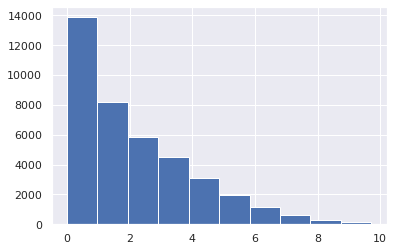

In [ ]:
VOCAB['h2'].hist()

In [ ]:
VOCAB['x_factor'] = np.log(VOCAB.term_rank) * VOCAB.h2

In [ ]:
px.scatter(VOCAB, x='term_rank', y='x_factor', hover_name='term_str', color='pos_max', hover_data=['n'])

In [ ]:
px.scatter(VOCAB, x='term_rank', y='x_factor', log_x=True, log_y=True, hover_name='term_str', color='pos_max', hover_data=['n'])

## Demo Table

In [ ]:
demo3 = VOCAB.loc[VOCAB.term_rank.isin(rank_index), ['term_str', 'pos_max', 'n', 'term_rank', 'zipf_k', 'tfidf_sum', 'h2', 'x_factor']]

In [ ]:
demo3.style.background_gradient(cmap=gradient_cmap)

,term_str,pos_max,n,term_rank,zipf_k,tfidf_sum,h2,x_factor
term_id,,,,,,,,
34776,the,DT,110093,1,110093,0.000000,9.655830,0.000000
23891,of,IN,65993,2,131986,0.000000,9.661666,6.696957
1426,and,CC,63528,3,190584,0.026542,9.714377,10.672334
18993,it,PRP,23976,10,239760,0.065809,9.546385,21.981365
39663,you,PRP,14542,20,290840,0.748575,8.948062,26.805997
16154,have,VB,10436,30,313080,0.172720,9.376721,31.892078
24018,one,CD,7386,40,295440,0.110691,9.560443,35.267320
1893,are,VBP,5787,50,289350,0.229071,9.287547,36.333097
39041,who,WP,4612,60,276720,0.161815,9.381246,38.410054


In [ ]:
px.scatter(demo3, x='term_rank', y='x_factor', log_x=True, log_y=True, text='term_str', color='pos_max', size='n')

# Reduce VOCAB

## Get VOCAB Stats

In [ ]:
# stats = VOCAB.describe().T

In [ ]:
# stats

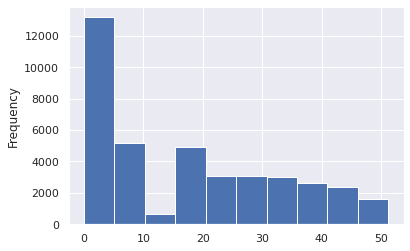

In [ ]:
VOCAB.x_factor.plot.hist()

## Select Significant Terms based on X Factor

In [ ]:
# key_col = 'tfidf_sum'
key_col = 'x_factor'
key_min = VOCAB[key_col].quantile(.9)
rank_min = 200

In [ ]:
SIGS = VOCAB.loc[(VOCAB[key_col] >= key_min) & (VOCAB.term_rank >= rank_min)].sort_values(key_col, ascending=False)

In [ ]:
SIGS.shape[0]

3872

In [ ]:
SIGS[['pos_max', 'term_str', 'n', 'term_rank', 'zipf_k', 'df', 'idf', 'tfidf_sum','x_factor']].head(100).style.background_gradient(cmap=gradient_cmap)

,pos_max,term_str,n,term_rank,zipf_k,df,idf,tfidf_sum,x_factor
term_id,,,,,,,,,
24263,RB,otherwise,269,740,199060,230,0.688265,0.104034,51.155092
21916,RB,merely,263,760,199880,220,0.707570,0.102640,50.928151
5001,VBG,calling,186,1052,195672,166,0.829885,0.080774,50.879684
19702,VBG,knowing,272,732,199104,221,0.705601,0.098153,50.656465
7569,JJ,contrary,145,1334,193430,135,0.919659,0.076153,50.598706
20163,VBG,leaving,358,557,199406,281,0.601287,0.130884,50.534472
6170,NN,circumstance,235,835,196225,194,0.762191,0.092921,50.497589
28870,NN,reply,194,1004,194776,167,0.827276,0.081750,50.470315
3467,IN,besides,368,541,199088,285,0.595148,0.124561,50.366983


# Save Work

In [ ]:
VOCAB.to_csv(data_dir + 'VOCAB2.csv')
TOKEN.to_csv(data_dir + 'TOKEN2.csv')
BOW.to_csv(data_dir + 'DOC2.csv')
DTCM.to_csv(data_dir + 'DTCM.csv')
TFIDF.to_csv(data_dir + 'TFIDF.csv')
SIGS.to_csv(data_dir + 'SIGS.csv')
WCM.to_csv(data_dir + 'WCM.csv')